In [2]:
from astropy.table import Table
import numpy as np
from matplotlib import pyplot as plt
import astropy
%matplotlib inline

In [3]:
def mad(data, axis=None, func=None, ignore_nan=True):
    """ Calculate the median absolute deviation."""
    if type(data) is not np.ndarray: raise ValueError("data must be a numpy array")    
    return 1.4826 * astropy.stats.median_absolute_deviation(data,axis=axis,func=func,ignore_nan=ignore_nan)

def gaussian(x, amp, cen, sig):
    return amp*np.exp(-(x-cen)**2 / sig**2)

def graphHist(x):
    x_axis = x

In [4]:
cat = Table.read("apogee_bulge.fits(2).gz", 1)
uniqueFields = np.unique(cat["FIELD"])

# Remove trailing spaces
for i in range(len(cat)):
    cat['FIELD'][i] = cat['FIELD'][i].strip()

#postive longitude is left side of buldge

#use help(INSERT COMMAND HERE) to get help on things

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


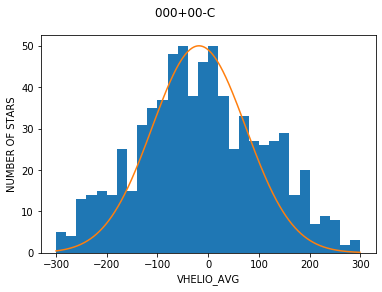

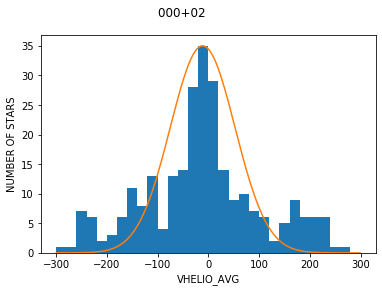

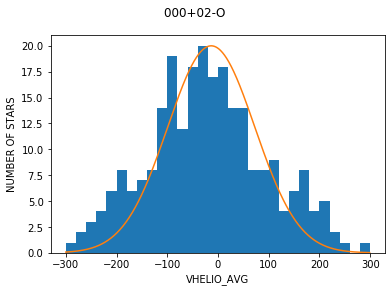

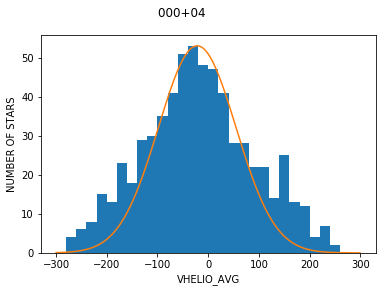

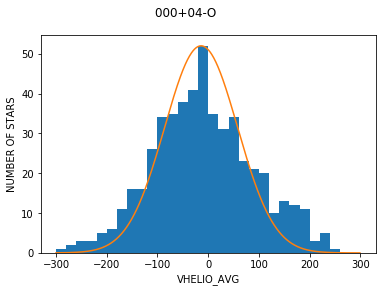

...

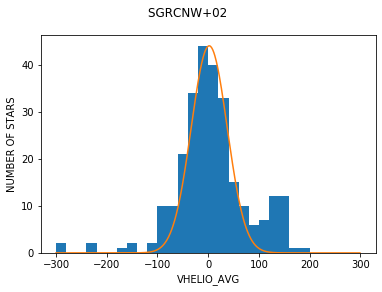

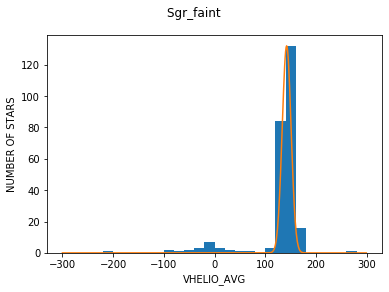

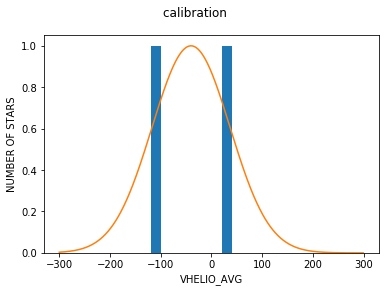

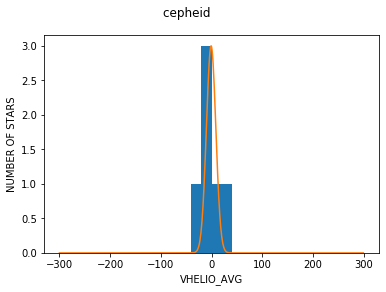

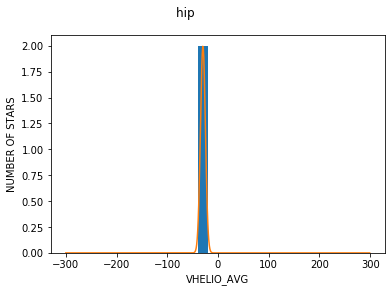

<Figure size 432x288 with 0 Axes>

In [17]:
xGauss = np.arange(-300, 300, 1)

for i in uniqueFields:
    ind, = np.where((cat["FIELD"]==str(i)) & (abs(cat['VHELIO_AVG'])<1000))
    newCat = cat[ind]
    vh = newCat["VHELIO_AVG"]
    (n, bins, patches) = plt.hist(vh, bins = 30, range=(-300,300))

    hist,edges = np.histogram(vh, range=(-300,300), bins=30)
    vTotal = np.sum(vh)
    starsTotal = np.sum(hist)

    vAvg = np.median(vh)
    #sigma = np.std(vh)
    sigma = mad(np.array(vh))
    amplitude = max(hist)
                                                                                                                                                     
    yGauss = gaussian(xGauss, amplitude, vAvg, sigma)

    plt.plot(xGuass, yGauss)
    
    plt.suptitle(i)
    plt.xlabel("VHELIO_AVG")
    plt.ylabel("NUMBER OF STARS")
    plt.figure(i)
    plt.show



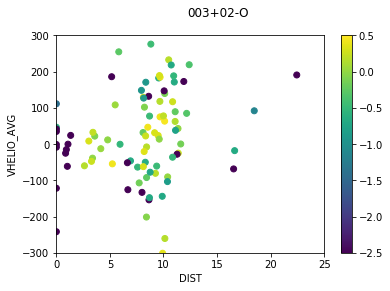

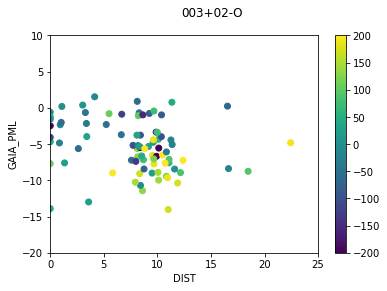

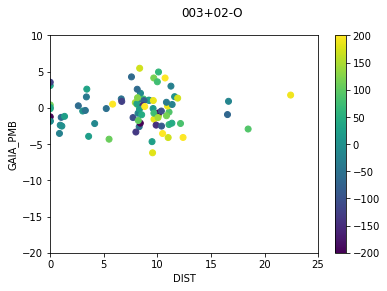

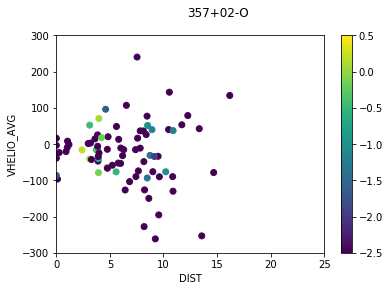

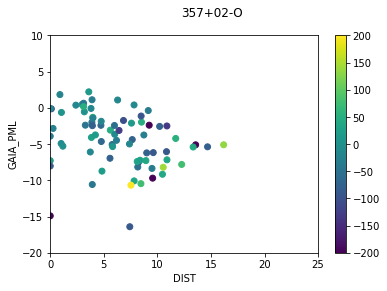

...

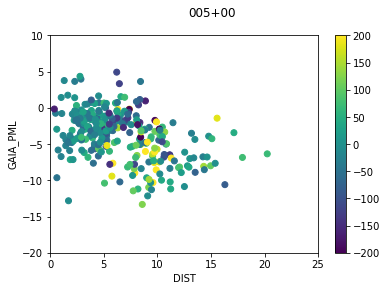

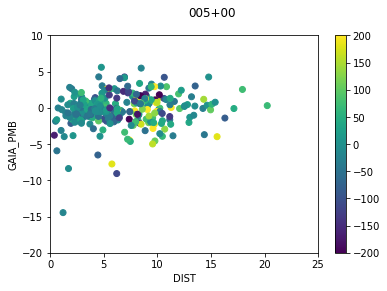

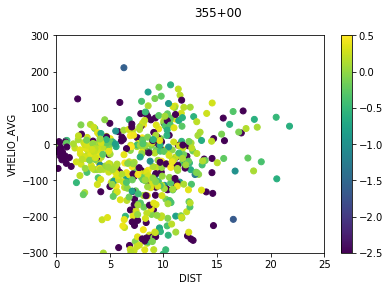

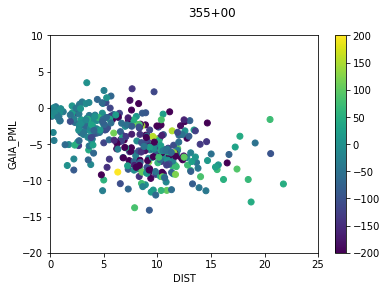

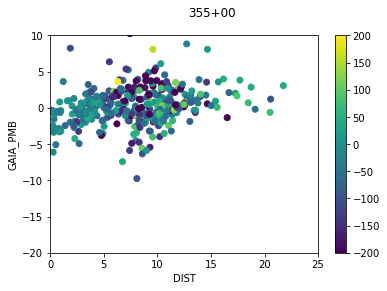

In [47]:
y_axis_values = ["DIST", "GAIA_PMRA", "GAIA_PMDEC"]
fieldsILike = [uniqueFields[34], uniqueFields[162], uniqueFields[38], uniqueFields[166], uniqueFields[50], uniqueFields[150]]

for i in fieldsILike:
    ind, = np.where((cat["FIELD"] == i) & (abs(cat['VHELIO_AVG'])<1000) & (cat['SNR']>20) & (cat['LOGG']<3.8))
    field = cat[ind]
    vh = field["VHELIO_AVG"]
    dist = field["DIST"]
    feh = field['FE_H']
    plt.ylabel("VHELIO_AVG")
    plt.xlabel("DIST")
    plt.suptitle(i)
    plt.ylim(-300,300)
    plt.xlim(0,25)
    plt.scatter(dist,vh,c=feh,vmin=-2.5,vmax=0.5)
    plt.colorbar()
    plt.show()
    
    pml = field["GAIA_PML"]
    plt.ylabel("GAIA_PML")
    plt.xlabel("DIST")
    plt.suptitle(i)
    plt.ylim(-20,10)
    plt.xlim(0,25)
    plt.scatter(dist,pml,c=vh,vmin=-200,vmax=200)
    plt.colorbar()
    plt.show()
    
    pmb = field["GAIA_PMB"]
    plt.ylabel("GAIA_PMB")
    plt.xlabel("DIST")
    plt.suptitle(i)
    plt.ylim(-20,10)
    plt.xlim(0,25)
    plt.scatter(dist,pmb,c=vh,vmin=-200,vmax=200)
    plt.colorbar()
    plt.show()

In [11]:
uniqueFields = np.unique(cat["FIELD"])
i = 0
#[uniqueFields[25], uniqueFields[162], uniqueFields[38], uniqueFields[166], uniqueFields[50], uniqueFields[150]
while i < len(uniqueFields):
    print(uniqueFields[i] + " and the array number is " + str(i))
    
    i += 1

000+00-C and the array number is 0
000+02 and the array number is 1
000+02-O and the array number is 2
000+04 and the array number is 3
000+04-O and the array number is 4
000+05-O and the array number is 5
000+08 and the array number is 6
000+08-S and the array number is 7
000+12 and the array number is 8
000+14 and the array number is 9
000-02 and the array number is 10
000-02-O and the array number is 11
000-03-O and the array number is 12
000-04 and the array number is 13
000-04-O and the array number is 14
000-08 and the array number is 15
000-12 and the array number is 16
001+01 and the array number is 17
001-01 and the array number is 18
001-01-O and the array number is 19
001-02-O and the array number is 20
001-04-O and the array number is 21
001-05-O and the array number is 22
002+00 and the array number is 23
002+00-C and the array number is 24
002+02-O and the array number is 25
002+04 and the array number is 26
002+06 and the array number is 27
002-02-O and the array number 

C:\Users\jakeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.
C:\Users\jakeh\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


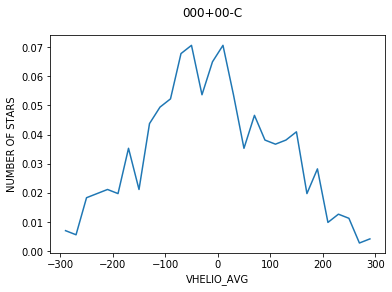

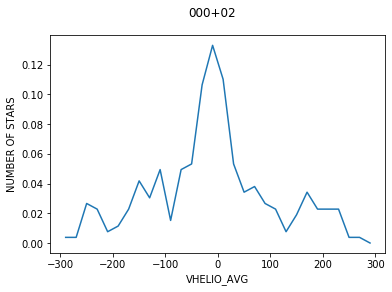

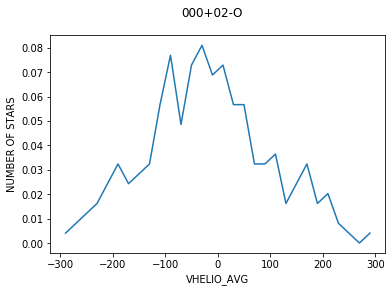

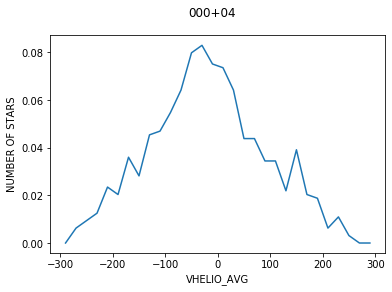

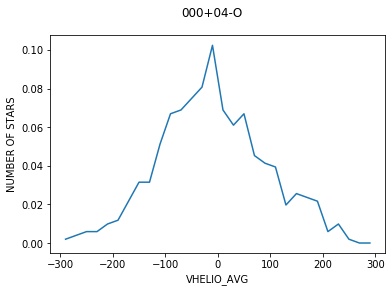

...

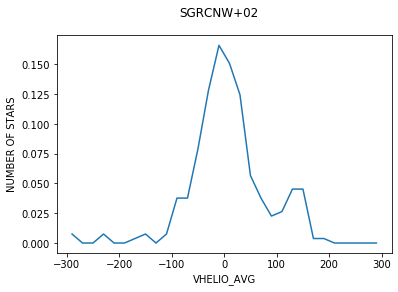

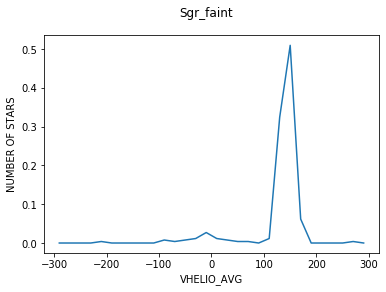

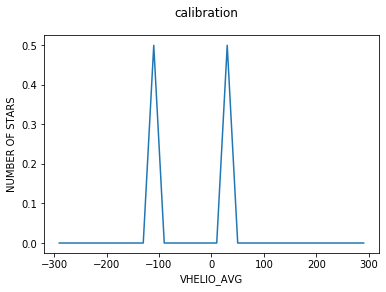

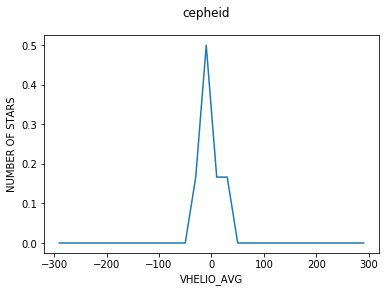

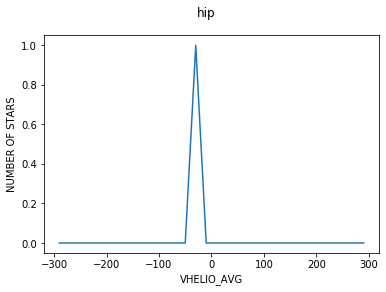

<Figure size 432x288 with 0 Axes>

In [12]:
for i in uniqueFields:
    ind, = np.where(cat["FIELD"]==i)
    newCat = cat[ind]
    x = newCat["VHELIO_AVG"]
    hist,edges=np.histogram(newCat['VHELIO_AVG'],range=(-300,300),bins=30)  
    plt.plot(edges[0:-1]+(edges[1]-edges[0])*0.5,hist/np.sum(hist))    
    plt.suptitle(i)
    plt.xlabel("VHELIO_AVG")
    plt.ylabel("NUMBER OF STARS")
    plt.figure(i)
    plt.show


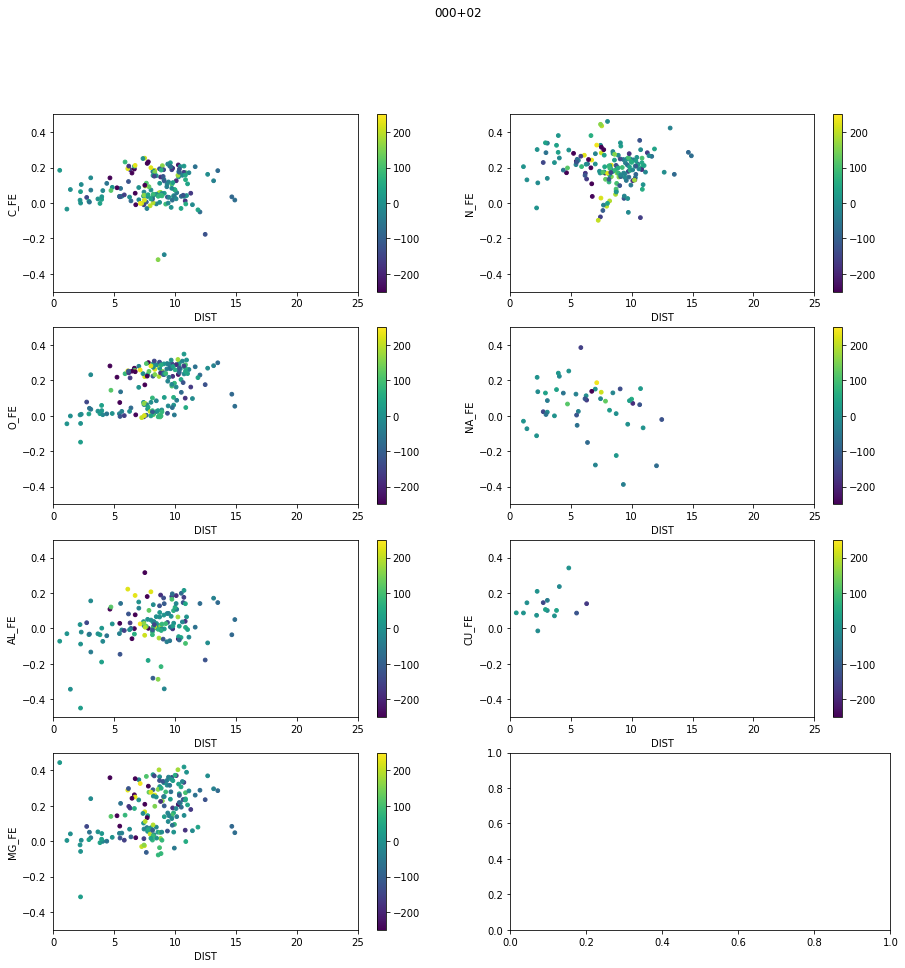

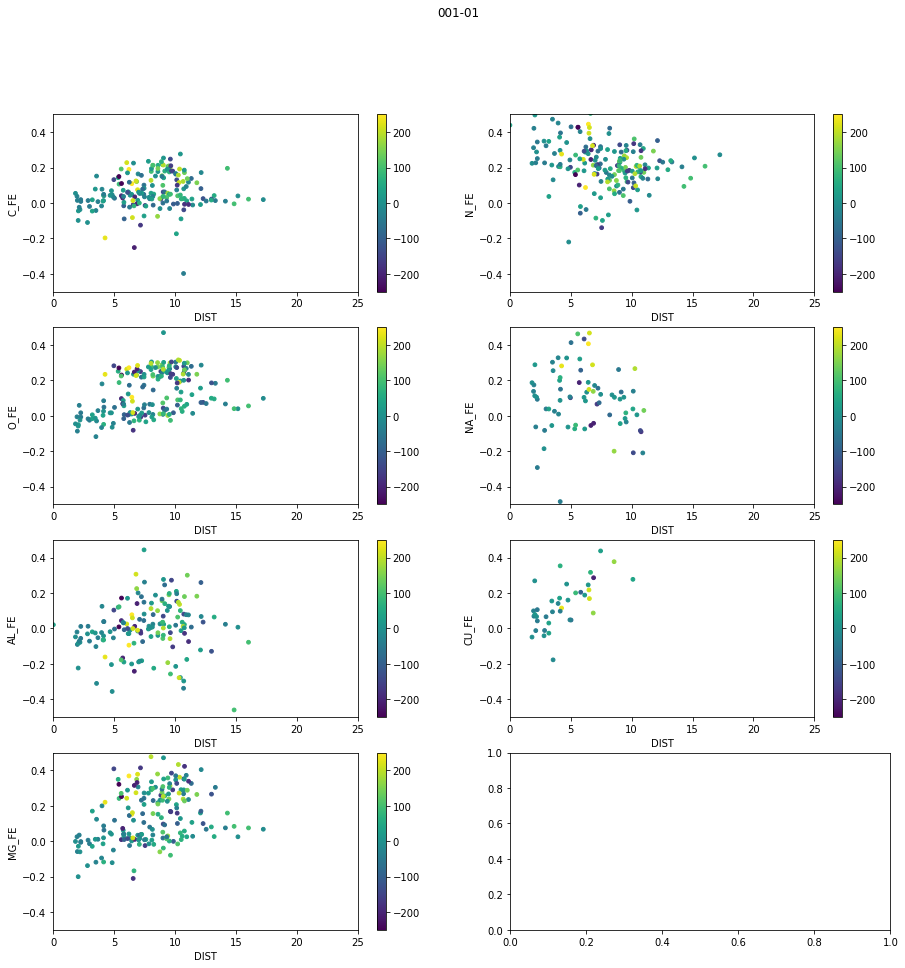

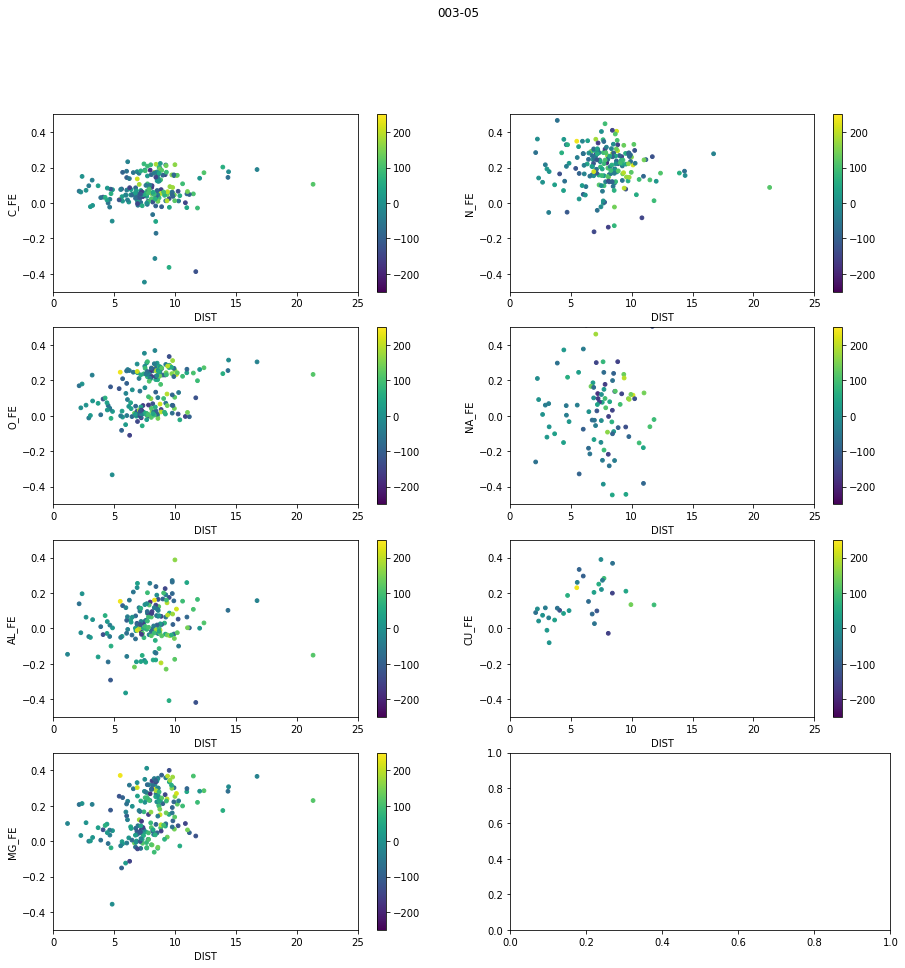

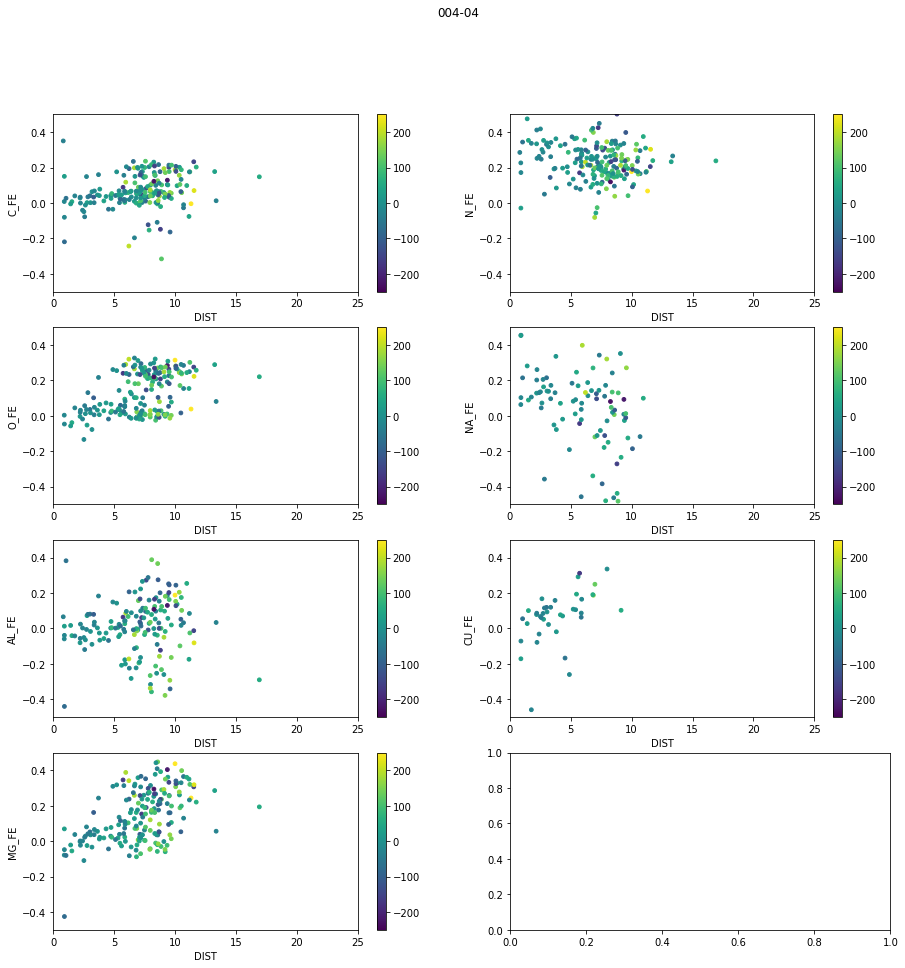

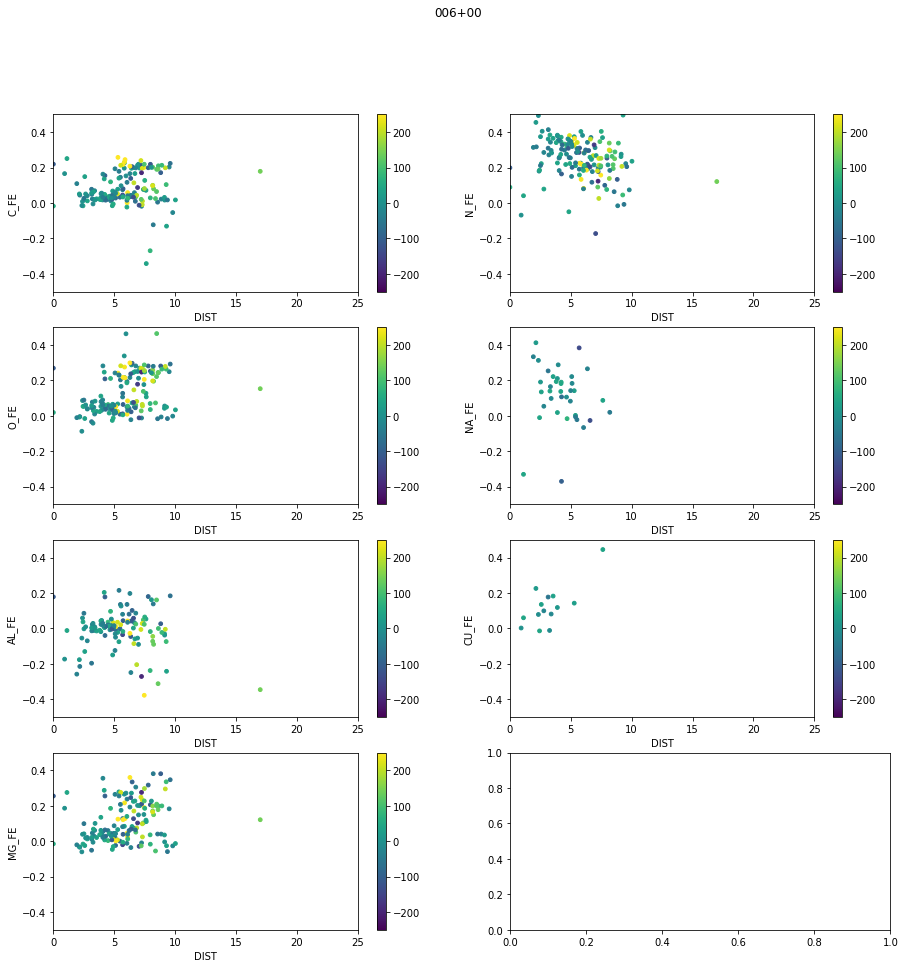

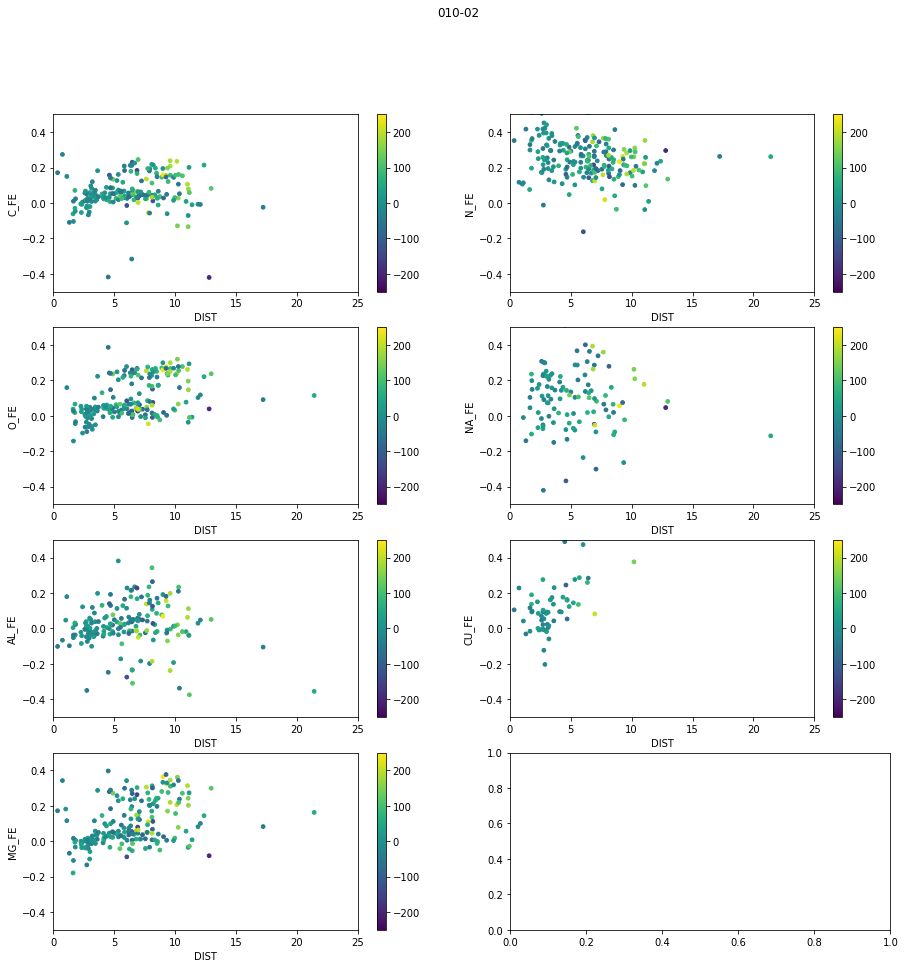

In [32]:
#looks at chemistry graphs
chemFields = ["000+02", "001-01", "003-05", "004-04", "006+00", "010-02"]
chemistry = ["RB_FE", "C_FE", "N_FE", "O_FE", "NA_FE", "AL_FE", "CU_FE", "MG_FE"]

#ennumerate function


for i in chemFields:
    plt.figure(i, figsize = (15,15))
    for k,element in enumerate(chemistry, start=1):
        ind, = np.where((cat["FIELD"] == i) & (cat['SNR']>20) & (cat['LOGG']<3.8) & (abs(cat[element])<10))
        field = cat[ind]
        dist = field["DIST"]
        nElement = field[element]
        plt.xlim(0,25)
        plt.ylim(-.5,.5)
        plt.xlabel("DIST")
        plt.ylabel(element)
        plt.suptitle(i)
        plt.scatter(dist, nElement, c = field["VHELIO_AVG"], vmin = -250, vmax = 250, s=14)
        plt.colorbar()
        plt.subplot(4, 2, k)
        plt.show

<TableColumns names=('APSTAR_ID','TARGET_ID','ASPCAP_ID','FILE','APOGEE_ID','TELESCOPE','LOCATION_ID','FIELD','J','J_ERR','H','H_ERR','K','K_ERR','RA','DEC','GLON','GLAT','APOGEE_TARGET1','APOGEE_TARGET2','APOGEE_TARGET3','APOGEE2_TARGET1','APOGEE2_TARGET2','APOGEE2_TARGET3','TARGFLAGS','SURVEY','PROGRAMNAME','NINST','NVISITS','COMBTYPE','COMMISS','SNR','STARFLAG','STARFLAGS','ANDFLAG','ANDFLAGS','VHELIO_AVG','VSCATTER','VERR','VERR_MED','OBSVHELIO_AVG','OBSVSCATTER','OBSVERR','OBSVERR_MED','SYNTHVHELIO_AVG','SYNTHVSCATTER','SYNTHVERR','SYNTHVERR_MED','RV_TEFF','RV_LOGG','RV_FEH','RV_ALPHA','RV_CARB','RV_CCFWHM','RV_AUTOFWHM','SYNTHSCATTER','STABLERV_CHI2','STABLERV_RCHI2','CHI2_THRESHOLD','STABLERV_CHI2_PROB','MEANFIB','SIGFIB','SNREV','APSTAR_VERSION','ASPCAP_VERSION','RESULTS_VERSION','EXTRATARG','MIN_H','MAX_H','MIN_JK','MAX_JK','PARAM','FPARAM','PARAM_COV','FPARAM_COV','TEFF','TEFF_ERR','LOGG','LOGG_ERR','VMICRO','VMACRO','VSINI','M_H','M_H_ERR','ALPHA_M','ALPHA_M_ERR','ASPCAP_CHI

In [23]:
help(plt.scatter)

Help on function scatter in module matplotlib.pyplot:

scatter(x, y, s=None, c=None, marker=None, cmap=None, norm=None, vmin=None, vmax=None, alpha=None, linewidths=None, verts=None, edgecolors=None, *, plotnonfinite=False, data=None, **kwargs)
    A scatter plot of *y* vs *x* with varying marker size and/or color.
    
    Parameters
    ----------
    x, y : array_like, shape (n, )
        The data positions.
    
    s : scalar or array_like, shape (n, ), optional
        The marker size in points**2.
        Default is ``rcParams['lines.markersize'] ** 2``.
    
    c : color, sequence, or sequence of color, optional
        The marker color. Possible values:
    
        - A single color format string.
        - A sequence of color specifications of length n.
        - A sequence of n numbers to be mapped to colors using *cmap* and
          *norm*.
        - A 2-D array in which the rows are RGB or RGBA.
    
        Note that *c* should not be a single numeric RGB or RGBA sequen